# Assignment 1

## Image Denoising

*Submission from 18EE10043, Rhitvik Sinha*  
*Performed in Google Colab*

In [1]:
!ls

images	noisy_10.jpg  sample_data


## Part 1

*Corrupt the images by randomly choosing some pixels and replacing the pixel values with random / junk values.*

In [2]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image

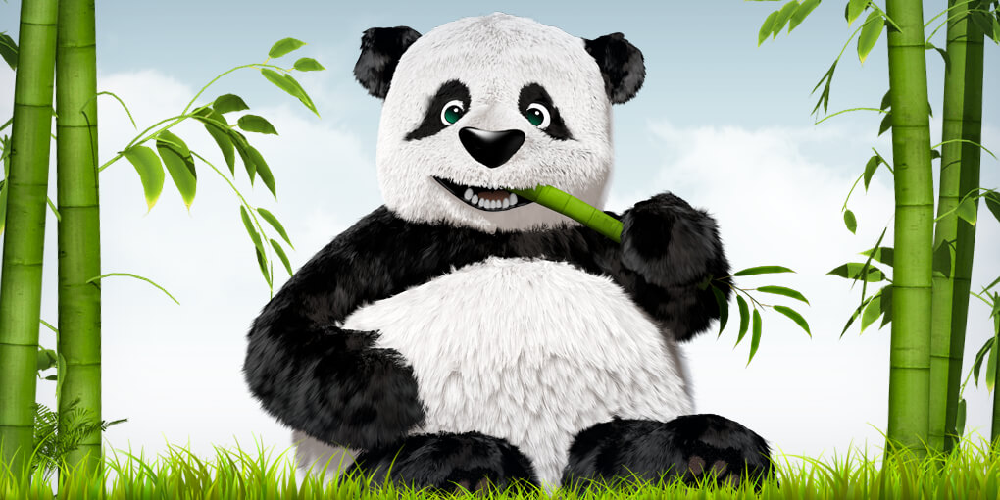

(510, 1020, 3)


In [3]:
img_path = "./images/"
img_name = "10.jpg"
img = cv2.imread(img_path + img_name, cv2.IMREAD_UNCHANGED)
cv2_imshow(img)
print(img.shape)

In [4]:
print(img[:5, :5, :])

[[[194 182 158]
  [201 187 164]
  [202 190 166]
  [180 181 155]
  [148 163 135]]

 [[193 183 159]
  [199 185 162]
  [202 188 165]
  [193 188 163]
  [170 177 150]]

 [[193 186 161]
  [196 182 159]
  [203 185 162]
  [203 189 166]
  [193 189 164]]

 [[196 189 164]
  [195 183 159]
  [199 181 158]
  [204 186 163]
  [203 189 166]]

 [[198 188 164]
  [197 185 161]
  [196 182 159]
  [202 184 161]
  [204 186 163]]]


Cells are randomly selected with the help of [np.random.rand](https://numpy.org/doc/stable/reference/random/generated/numpy.random.rand.html) that generates a random number in the range [0,1). When the generated number is greater than a certain threshold (0.9 here), we corrupt the pixel with a random number. Hence for 0.9, 10% of the pixels will be randomly corrupted.

This random number is generated by [np.random.randn](https://numpy.org/doc/stable/reference/random/generated/numpy.random.randn.html) that returns a single float, randomly sampled from a univariate “normal” (Gaussian) distribution of mean 0 and variance 1.

[np.clip](https://numpy.org/doc/stable/reference/generated/numpy.clip.html) is used to limit the values from overflowing beyond 255.

In [5]:
noisy_img = np.copy(img)
noise_threshold = 0.9

for i in range(noisy_img.shape[0]):
    for j in range(noisy_img.shape[1]):
        for c in range(noisy_img.shape[2]):
            if np.random.rand() > noise_threshold:
                noisy_img[i,j,c] = (255 * np.random.randn())

noisy_img = np.clip(noisy_img, 0, 255)

print("Noise successfully added to image!")

Noise successfully added to image!


## Part 2

*Display and save the noisy images.*

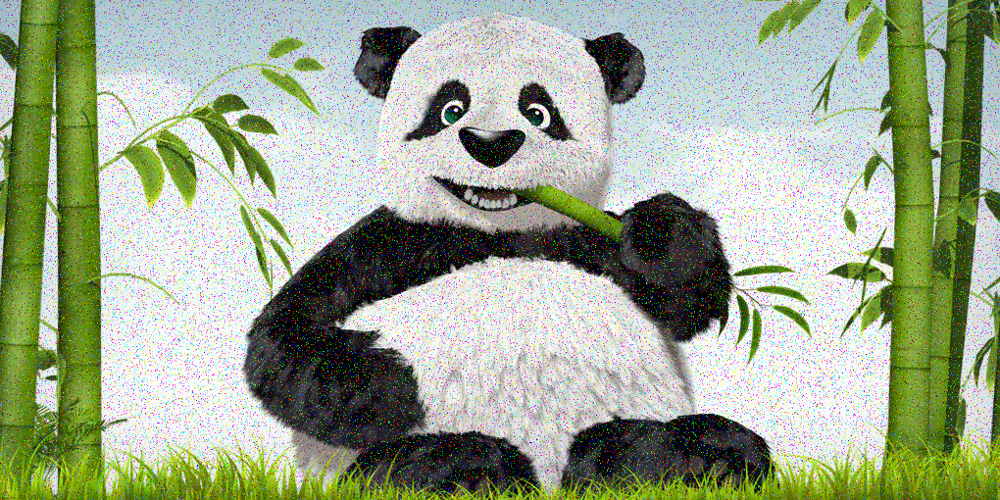

In [6]:
cv2_imshow(noisy_img)

In [7]:
filename = "./noisy_" + img_name
cv2.imwrite(filename, noisy_img)

True

## Part 3

*Read in the saved noisy images. Identify the noisy pixels by comparing them with neighboring pixels.*

In [8]:
new_img_path = "./noisy_10.jpg"
new_img = cv2.imread(new_img_path, cv2.IMREAD_UNCHANGED)

The `compare` function in the next code-block is reponsible for comparing all the pixels, to detect the noisy pixel, and then replacing the noisy pixel with the mean / median of it's neighbourood.

In [9]:
def compare(arr, method="mean", width=3, tolerance=30):

    for i in range(width, (arr.shape[0] - width)):
        for j in range(width, (arr.shape[1] - width)):
            for c in range(arr.shape[2]):

                compare_matrix = arr[(i-width):(i+width), (j-width):(j+width), c]

                if method == "median":
                    compare_value = np.median(compare_matrix)
                else:
                    compare_value = np.mean(compare_matrix)
                
                if (abs(arr[i, j, c] - compare_value) >= tolerance):
                    arr[i, j, c] = compare_value
    
    return arr

## Part 4

*Replace the "noisy pixels" identified in part 3 with mean and median of the neighboring pixels. Consider different "neighborhoods". Display the "denoised" images.*

Next code-block tests the `compare` function with default values of `method="mean"`, `width=3` and `tolerance=30`

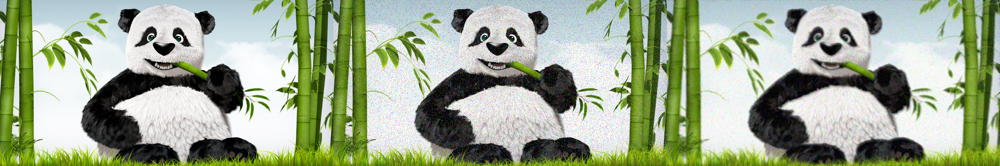

In [10]:
new_img_default = np.copy(new_img)
new_img_default = compare(new_img_default)
result_default = np.hstack((img, noisy_img, new_img_default))
cv2_imshow(result_default)

Changing value for `method` to `method="median"`:

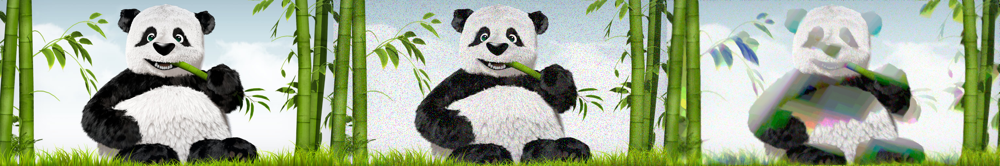

In [11]:
new_img_1 = np.copy(new_img)
new_img_1 = compare(new_img_1, method="median")
result_1 = np.hstack((img, noisy_img, new_img_1))
cv2_imshow(result_1)

For `method="mean"`, `width=3` and `tolerance=50`:

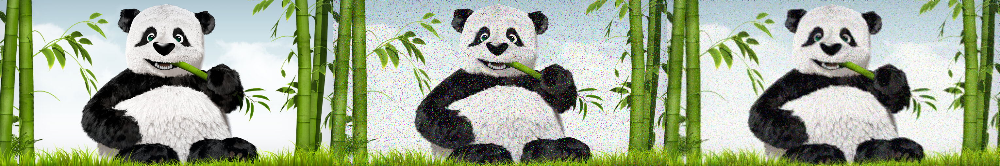

In [12]:
new_img_2 = np.copy(new_img)
new_img_2 = compare(new_img_2, tolerance=50)
result_2 = np.hstack((img, noisy_img, new_img_2))
cv2_imshow(result_2)

For `method="mean"`, `width=2` and `tolerance=30`:

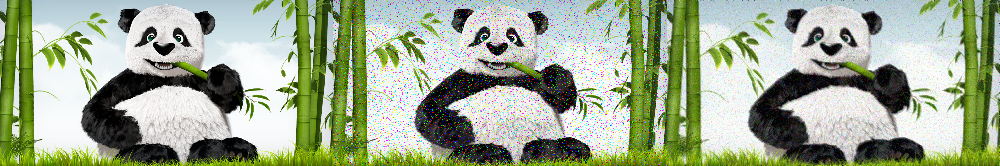

In [13]:
new_img_3 = np.copy(new_img)
new_img_3 = compare(new_img_3, width=2)
result_3 = np.hstack((img, noisy_img, new_img_3))
cv2_imshow(result_3)

For `method="mean"`, `width=1` and `tolerance=50`:

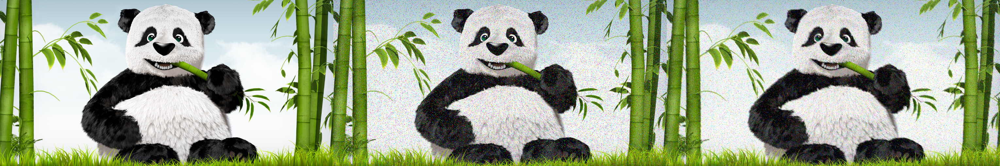

In [14]:
new_img_4 = np.copy(new_img)
new_img_4 = compare(new_img_4, width=1, tolerance=50)
result_4 = np.hstack((img, noisy_img, new_img_4))
cv2_imshow(result_4)